# Data Preparation & Exploration

## Introduction

- This notebook aims at getting a good insight in the data for the Porto Seguro competition. Besides, it gives some tips and trics to prepare your data for modeling.

## Loading packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler

from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectFromModel
from sklearn.utils import shuffle
from sklearn.ensemble import RandomForestClassifier

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

## Loading data

In [2]:
# 데이터 수가 많을 때, 데이터를 부분적으로 불러오기
DEBUG = True

In [3]:
if DEBUG:
    NROWS = 500000
else:
    NROWS = None

In [4]:
# imbalance가 걱정된다면, StratifiedKFold 사용하여 shuffle.

In [5]:
%%time
train = pd.read_csv('./train.csv')
test = pd.read_csv('./test.csv')

CPU times: user 4.9 s, sys: 688 ms, total: 5.59 s
Wall time: 5.61 s


## Data at first sight

- Features that belong to __similar groupings are tagged__ as such in the feature names (e.g., ind, reg, car, calc).
- Feature names include the postfix __bin__ to indicate binary features and cat to indicate categorical features.
- Features __without these designations are either continuous or ordinal__.
- Values of __-1__ indicate that the feature was __missing__ from the observation.
- The __target__ columns signifies whether or not a claim was filed for that policy holder.

In [6]:
train.head()

,id,target,ps_ind_01,ps_ind_02_cat,ps_ind_03,ps_ind_04_cat,ps_ind_05_cat,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_10_bin,ps_ind_11_bin,ps_ind_12_bin,ps_ind_13_bin,ps_ind_14,ps_ind_15,ps_ind_16_bin,ps_ind_17_bin,ps_ind_18_bin,ps_reg_01,ps_reg_02,ps_reg_03,ps_car_01_cat,ps_car_02_cat,ps_car_03_cat,ps_car_04_cat,ps_car_05_cat,ps_car_06_cat,ps_car_07_cat,ps_car_08_cat,ps_car_09_cat,ps_car_10_cat,ps_car_11_cat,ps_car_11,ps_car_12,ps_car_13,ps_car_14,ps_car_15,ps_calc_01,ps_calc_02,ps_calc_03,ps_calc_04,ps_calc_05,ps_calc_06,ps_calc_07,ps_calc_08,ps_calc_09,ps_calc_10,ps_calc_11,ps_calc_12,ps_calc_13,ps_calc_14,ps_calc_15_bin,ps_calc_16_bin,ps_calc_17_bin,ps_calc_18_bin,ps_calc_19_bin,ps_calc_20_bin
0,7,0,2,2,5,1,0,0,1,0,0,0,0,0,0,0,11,0,1,0,0.7,0.2,0.718070,10,1,-1,0,1,4,1,0,0,1,12,2,0.400000,0.883679,0.370810,3.605551,0.6,0.5,0.2,3,1,10,1,10,1,5,9,1,5,8,0,1,1,0,0,1
1,9,0,1,1,7,0,0,0,0,1,0,0,0,0,0,0,3,0,0,1,0.8,0.4,0.766078,11,1,-1,0,-1,11,1,1,2,1,19,3,0.316228,0.618817,0.388716,2.449490,0.3,0.1,0.3,2,1,9,5,8,1,7,3,1,1,9,0,1,1,0,1,0
2,13,0,5,4,9,1,0,0,0,1,0,0,0,0,0,0,12,1,0,0,0.0,0.0,-1.000000,7,1,-1,0,-1,14,1,1,2,1,60,1,0.316228,0.641586,0.347275,3.316625,0.5,0.7,0.1,2,2,9,1,8,2,7,4,2,7,7,0,1,1,0,1,0
3,16,0,0,1,2,0,0,1,0,0,0,0,0,0,0,0,8,1,0,0,0.9,0.2,0.580948,7,1,0,0,1,11,1,1,3,1,104,1,0.374166,0.542949,0.294958,2.000000,0.6,0.9,0.1,2,4,7,1,8,4,2,2,2,4,9,0,0,0,0,0,0
4,17,0,0,2,0,1,0,1,0,0,0,0,0,0,0,0,9,1,0,0,0.7,0.6,0.840759,11,1,-1,0,-1,14,1,1,2,1,82,3,0.316070,0.565832,0.365103,2.000000,0.4,0.6,0.0,2,2,6,3,10,2,12,3,1,1,3,0,0,0,1,1,0


In [7]:
train.shape

(595212, 59)

In [8]:
train.tail()

,id,target,ps_ind_01,ps_ind_02_cat,ps_ind_03,ps_ind_04_cat,ps_ind_05_cat,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_10_bin,ps_ind_11_bin,ps_ind_12_bin,ps_ind_13_bin,ps_ind_14,ps_ind_15,ps_ind_16_bin,ps_ind_17_bin,ps_ind_18_bin,ps_reg_01,ps_reg_02,ps_reg_03,ps_car_01_cat,ps_car_02_cat,ps_car_03_cat,ps_car_04_cat,ps_car_05_cat,ps_car_06_cat,ps_car_07_cat,ps_car_08_cat,ps_car_09_cat,ps_car_10_cat,ps_car_11_cat,ps_car_11,ps_car_12,ps_car_13,ps_car_14,ps_car_15,ps_calc_01,ps_calc_02,ps_calc_03,ps_calc_04,ps_calc_05,ps_calc_06,ps_calc_07,ps_calc_08,ps_calc_09,ps_calc_10,ps_calc_11,ps_calc_12,ps_calc_13,ps_calc_14,ps_calc_15_bin,ps_calc_16_bin,ps_calc_17_bin,ps_calc_18_bin,ps_calc_19_bin,ps_calc_20_bin
595207,1488013,0,3,1,10,0,0,0,0,0,1,0,0,0,0,0,13,1,0,0,0.5,0.3,0.692820,10,1,-1,0,1,1,1,1,0,1,31,3,0.374166,0.684631,0.385487,2.645751,0.4,0.5,0.3,3,0,9,0,9,1,12,4,1,9,6,0,1,1,0,1,1
595208,1488016,0,5,1,3,0,0,0,0,0,1,0,0,0,0,0,6,1,0,0,0.9,0.7,1.382027,9,1,-1,0,-1,15,0,0,2,1,63,2,0.387298,0.972145,-1.000000,3.605551,0.2,0.2,0.0,2,4,8,6,8,2,12,4,1,3,8,1,0,1,0,1,1
595209,1488017,0,1,1,10,0,0,1,0,0,0,0,0,0,0,0,12,1,0,0,0.9,0.2,0.659071,7,1,-1,0,-1,1,1,1,2,1,31,3,0.397492,0.596373,0.398748,1.732051,0.4,0.0,0.3,3,2,7,4,8,0,10,3,2,2,6,0,0,1,0,0,0
595210,1488021,0,5,2,3,1,0,0,0,1,0,0,0,0,0,0,12,1,0,0,0.9,0.4,0.698212,11,1,-1,0,-1,11,1,1,2,1,101,3,0.374166,0.764434,0.384968,3.162278,0.0,0.7,0.0,4,0,9,4,9,2,11,4,1,4,2,0,1,1,1,0,0
595211,1488027,0,0,1,8,0,0,1,0,0,0,0,0,0,0,0,7,1,0,0,0.1,0.2,-1.000000,7,0,-1,0,-1,0,1,0,2,1,34,2,0.400000,0.932649,0.378021,3.741657,0.4,0.0,0.5,2,3,10,4,10,2,5,4,4,3,8,0,1,0,0,0,0


categorical variables of which the category values are integers

In [9]:
cat_cols = [col for col in train.columns if 'cat' in col]

In [10]:
for col in cat_cols:
    print(col, train[col].nunique())

ps_ind_02_cat 5
ps_ind_04_cat 3
ps_ind_05_cat 8
ps_car_01_cat 13
ps_car_02_cat 3
ps_car_03_cat 3
ps_car_04_cat 10
ps_car_05_cat 3
ps_car_06_cat 18
ps_car_07_cat 3
ps_car_08_cat 2
ps_car_09_cat 6
ps_car_10_cat 3
ps_car_11_cat 104


In [11]:
test.shape

(892816, 58)

In [12]:
train.drop_duplicates()
train.shape

(595212, 59)

No duplicate rows, so that's fine

In [13]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 595212 entries, 0 to 595211
Data columns (total 59 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              595212 non-null  int64  
 1   target          595212 non-null  int64  
 2   ps_ind_01       595212 non-null  int64  
 3   ps_ind_02_cat   595212 non-null  int64  
 4   ps_ind_03       595212 non-null  int64  
 5   ps_ind_04_cat   595212 non-null  int64  
 6   ps_ind_05_cat   595212 non-null  int64  
 7   ps_ind_06_bin   595212 non-null  int64  
 8   ps_ind_07_bin   595212 non-null  int64  
 9   ps_ind_08_bin   595212 non-null  int64  
 10  ps_ind_09_bin   595212 non-null  int64  
 11  ps_ind_10_bin   595212 non-null  int64  
 12  ps_ind_11_bin   595212 non-null  int64  
 13  ps_ind_12_bin   595212 non-null  int64  
 14  ps_ind_13_bin   595212 non-null  int64  
 15  ps_ind_14       595212 non-null  int64  
 16  ps_ind_15       595212 non-null  int64  
 17  ps_ind_16_

Again, with the info() method we see that the data type is integer or float. (2020.08.17)

## Metadata

- To facilitate the data management, we'll store meta-information about the variables in a DataFrame. This will be helpful when we want to select specific variables for analysis, visualization, modeling

- Concretely we will store:   
    - __role__: input, ID, target
    - __level__: nominal, interval, ordinal, binary
    - __keep__: True or False
    - __dtype__: int, float, str

In [14]:
data = []
for f in train.columns:
    # Defining the role
    if f == 'target':
        role = 'target'
    elif f == 'id':
        role = 'id'
    else:
        role = 'input'
         
    # Defining the level
    if 'bin' in f or f == 'target':
        level = 'binary'
    elif 'cat' in f or f == 'id':
        level = 'nominal'
    elif train[f].dtype == float:
        level = 'interval'
    elif train[f].dtype == int:
        level = 'ordinal'
        
    # Initialize keep to True for all variables except for id
    keep = True
    if f == 'id':
        keep = False
    
    # Defining the data type 
    dtype = train[f].dtype
    
    # Creating a Dict that contains all the metadata for the variable
    f_dict = {
        'varname': f,
        'role': role,
        'level': level,
        'keep': keep,
        'dtype': dtype
    }
    data.append(f_dict)
    
meta = pd.DataFrame(data, columns=['varname', 'role', 'level', 'keep', 'dtype'])
meta.set_index('varname', inplace=True)

In [15]:
meta

,role,level,keep,dtype
varname,,,,
id,id,nominal,False,int64
target,target,binary,True,int64
ps_ind_01,input,ordinal,True,int64
ps_ind_02_cat,input,nominal,True,int64
ps_ind_03,input,ordinal,True,int64
ps_ind_04_cat,input,nominal,True,int64
ps_ind_05_cat,input,nominal,True,int64
ps_ind_06_bin,input,binary,True,int64
ps_ind_07_bin,input,binary,True,int64


- Example to extract all nominal variables that are not dropped

In [16]:
meta[(meta.level == 'nominal') & (meta.keep)].index

Index(['ps_ind_02_cat', 'ps_ind_04_cat', 'ps_ind_05_cat', 'ps_car_01_cat',
       'ps_car_02_cat', 'ps_car_03_cat', 'ps_car_04_cat', 'ps_car_05_cat',
       'ps_car_06_cat', 'ps_car_07_cat', 'ps_car_08_cat', 'ps_car_09_cat',
       'ps_car_10_cat', 'ps_car_11_cat'],
      dtype='object', name='varname')

- Below the number of variables per role and level are displayed.

In [17]:
pd.DataFrame({'count' : meta.groupby(['role', 'level'])['role'].size()}).reset_index()

,role,level,count
0,id,nominal,1
1,input,binary,17
2,input,interval,10
3,input,nominal,14
4,input,ordinal,16
5,target,binary,1


## Descriptive statistics

- We can also apply the describe method on the dataframe. However, it doesn't make much sense to calculate the mean, std, ... on categorical variables and the id variable. We'll explore the categorical variables visually later.
- Thanks to our meta file we can easily select the variables on which we want to compute the descriptive statistics.

### Interval variables

In [18]:
v = meta[(meta.level == 'interval') & (meta.keep)].index
train[v].describe()

,ps_reg_01,ps_reg_02,ps_reg_03,ps_car_12,ps_car_13,ps_car_14,ps_car_15,ps_calc_01,ps_calc_02,ps_calc_03
count,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000
mean,0.610991,0.439184,0.551102,0.379945,0.813265,0.276256,3.065899,0.449756,0.449589,0.449849
std,0.287643,0.404264,0.793506,0.058327,0.224588,0.357154,0.731366,0.287198,0.286893,0.287153
min,0.000000,0.000000,-1.000000,-1.000000,0.250619,-1.000000,0.000000,0.000000,0.000000,0.000000
25%,0.400000,0.200000,0.525000,0.316228,0.670867,0.333167,2.828427,0.200000,0.200000,0.200000
50%,0.700000,0.300000,0.720677,0.374166,0.765811,0.368782,3.316625,0.500000,0.400000,0.500000
75%,0.900000,0.600000,1.000000,0.400000,0.906190,0.396485,3.605551,0.700000,0.700000,0.700000
max,0.900000,1.800000,4.037945,1.264911,3.720626,0.636396,3.741657,0.900000,0.900000,0.900000


__reg variables__
- only ps_reg_03 has missing values
- the range (min to max) differs between the variables. We could apply __scaling__ (e.g. StandardScaler), but it depends on the classifier we will want to use. (scaling 필요함)

__car variables__
- ps_car_12 and ps_car_15 have missing values
- again, the range differs and we could apply scaling.


__calc variables__
- no missing values
- this seems to be some kind of ratio as the maximum is 0.9
- all three_calc variables have very similar distributions

- Overall, we can see that the range of the interval variables is rather small. Perhaps some transformation (e.g. log) is already applied in order to anonymize the data?

### Ordinal variables

In [19]:
v = meta[(meta.level == 'ordinal') & (meta.keep)].index
train[v].describe()

,ps_ind_01,ps_ind_03,ps_ind_14,ps_ind_15,ps_car_11,ps_calc_04,ps_calc_05,ps_calc_06,ps_calc_07,ps_calc_08,ps_calc_09,ps_calc_10,ps_calc_11,ps_calc_12,ps_calc_13,ps_calc_14
count,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000
mean,1.900378,4.423318,0.012451,7.299922,2.346072,2.372081,1.885886,7.689445,3.005823,9.225904,2.339034,8.433590,5.441382,1.441918,2.872288,7.539026
std,1.983789,2.699902,0.127545,3.546042,0.832548,1.117219,1.134927,1.334312,1.414564,1.459672,1.246949,2.904597,2.332871,1.202963,1.694887,2.746652
min,0.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,0.000000,5.000000,2.000000,2.000000,1.000000,7.000000,2.000000,8.000000,1.000000,6.000000,4.000000,1.000000,2.000000,6.000000
50%,1.000000,4.000000,0.000000,7.000000,3.000000,2.000000,2.000000,8.000000,3.000000,9.000000,2.000000,8.000000,5.000000,1.000000,3.000000,7.000000
75%,3.000000,6.000000,0.000000,10.000000,3.000000,3.000000,3.000000,9.000000,4.000000,10.000000,3.000000,10.000000,7.000000,2.000000,4.000000,9.000000
max,7.000000,11.000000,4.000000,13.000000,3.000000,5.000000,6.000000,10.000000,9.000000,12.000000,7.000000,25.000000,19.000000,10.000000,13.000000,23.000000


### Binary variables

In [20]:
v = meta[(meta.level == 'binary') & (meta.keep)].index
train[v].describe()

,target,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_10_bin,ps_ind_11_bin,ps_ind_12_bin,ps_ind_13_bin,ps_ind_16_bin,ps_ind_17_bin,ps_ind_18_bin,ps_calc_15_bin,ps_calc_16_bin,ps_calc_17_bin,ps_calc_18_bin,ps_calc_19_bin,ps_calc_20_bin
count,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000,595212.000000
mean,0.036448,0.393742,0.257033,0.163921,0.185304,0.000373,0.001692,0.009439,0.000948,0.660823,0.121081,0.153446,0.122427,0.627840,0.554182,0.287182,0.349024,0.153318
std,0.187401,0.488579,0.436998,0.370205,0.388544,0.019309,0.041097,0.096693,0.030768,0.473430,0.326222,0.360417,0.327779,0.483381,0.497056,0.452447,0.476662,0.360295
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


- A priori in the train data is 3.645%, which is __strongly imbalanced__. 
- From the means we can conclude that for most variables the value is zero in most cases.

## Handling imbalanced classes

- As we mentioned above the proportion of records with target = 1 is far less than target = 0. This can lead to a model that has great accuracy but does have any added value in practice.

- Two possible strategies to deal with this probelm are:
    - oversampling records with target = 1
    - undersampling records with target = 0

__SMOTE__ 를 사용하여 imbalanced classes를 다룰 수 있음
categorical data는 애매한 부분이 있음. (원핫 인코딩으로 변경 후 적용?)

- 여기서는 undersampling을 사용함

In [21]:
desired_apriori = 0.10

# Get the indices per target value
idx_0 = train[train.target == 0].index
idx_1 = train[train.target == 1].index

In [22]:
# Get original number of records per target value
nb_0 = len(train.loc[idx_0])
nb_1 = len(train.loc[idx_1])

In [23]:
# Calculate the undersampling rate and resulting number of records with target = 0
undersampling_rate = ((1-desired_apriori)*nb_1)/(nb_0*desired_apriori)
undersampled_nb_0 = int(undersampling_rate*nb_0)
print('Rate to undersample records with target=0: {}'.format(undersampling_rate))
print('Number of records with target=0 after undersampling: {}'.format(undersampled_nb_0))

Rate to undersample records with target=0: 0.34043569687437886
Number of records with target=0 after undersampling: 195246


In [24]:
undersampled_idx = shuffle(idx_0, random_state = 37, n_samples=undersampled_nb_0)

In [25]:
# Construct list with remaining indices
idx_list = list(undersampled_idx) + list(idx_1)

# Return undersample data frame
train = train.loc[idx_list].reset_index(drop=True)

## Data Quality Checks

### Checking missing values

- Missings are represented as -1

In [26]:
vars_with_missing = []

for f in train.columns:
    missings = train[train[f] == -1][f].count()
    if missings > 0:
        vars_with_missing.append(f)
        missings_perc = missings/train.shape[0]
        
        print('Variable {} has {} records ({:.2%}) with missing values'.format(f, missings, missings_perc))
        
print('In total, there are {} variables with missing values'.format(len(vars_with_missing)))

Variable ps_ind_02_cat has 103 records (0.05%) with missing values
Variable ps_ind_04_cat has 51 records (0.02%) with missing values
Variable ps_ind_05_cat has 2256 records (1.04%) with missing values
Variable ps_reg_03 has 38580 records (17.78%) with missing values
Variable ps_car_01_cat has 62 records (0.03%) with missing values
Variable ps_car_02_cat has 2 records (0.00%) with missing values
Variable ps_car_03_cat has 148367 records (68.39%) with missing values
Variable ps_car_05_cat has 96026 records (44.26%) with missing values
Variable ps_car_07_cat has 4431 records (2.04%) with missing values
Variable ps_car_09_cat has 230 records (0.11%) with missing values
Variable ps_car_11 has 1 records (0.00%) with missing values
Variable ps_car_14 has 15726 records (7.25%) with missing values
In total, there are 12 variables with missing values


- __ps_car_03_cat and ps_car_05_cat__ have a large proportion of records with missing values. Remove these variables.
- For the other categorical variables with missing values, we can leave the missing value -1 as such.
- __ps_reg_03__ (continuous) has missing values for 18% of all records. Replace by the mean.
- __ps_car_11__ (ordinal) has only 5 records with misisng values. Replace by the mode.
- __ps_car_12__ (continuous) has only 1 records with missing value. Replace by the mean.
- __ps_car_14__ (continuous) has missing values for 7% of all records. Replace by the mean. 

In [27]:
# Dropping the variables with too many missing values
vars_to_drop = ['ps_car_03_cat', 'ps_car_05_cat']
train.drop(vars_to_drop, axis = 1, inplace = True)
meta.loc[(vars_to_drop), 'keep'] = False # Updating the meta

In [28]:
# Imputing with the mean or mode
mean_imp = SimpleImputer(missing_values=-1, strategy='mean')
mode_imp = SimpleImputer(missing_values=-1, strategy='most_frequent')
train['ps_reg_03'] = mean_imp.fit_transform(train[['ps_reg_03']]).ravel()
train['ps_car_12'] = mean_imp.fit_transform(train[['ps_car_12']]).ravel()
train['ps_car_14'] = mean_imp.fit_transform(train[['ps_car_14']]).ravel()
train['ps_car_11'] = mode_imp.fit_transform(train[['ps_car_11']]).ravel()

### Checking the cardinality of the categorical variables

- Cardinality refers to the number of different values in a variable. As we will create dummy variables from the categorical variables later on, we need to check whether there are variables with many distinct values.
- We should handle these variables differently as they would result in many dummy variables.

In [29]:
v = meta[(meta.level == 'nominal') & (meta.keep)].index

In [30]:
for f in v:
    dist_values = train[f].value_counts().shape[0]
    print('variavle {} has {} distinct values'.format(f, dist_values))

variavle ps_ind_02_cat has 5 distinct values
variavle ps_ind_04_cat has 3 distinct values
variavle ps_ind_05_cat has 8 distinct values
variavle ps_car_01_cat has 13 distinct values
variavle ps_car_02_cat has 3 distinct values
variavle ps_car_04_cat has 10 distinct values
variavle ps_car_06_cat has 18 distinct values
variavle ps_car_07_cat has 3 distinct values
variavle ps_car_08_cat has 2 distinct values
variavle ps_car_09_cat has 6 distinct values
variavle ps_car_10_cat has 3 distinct values
variavle ps_car_11_cat has 104 distinct values


(2020.08.19)

In [31]:
def add_noise(series, noise_level):
    return series * (1 + noise_level * np.random.randn(len(series)))

def target_encode(trn_series=None, 
                  tst_series=None, 
                  target=None, 
                  min_samples_leaf=1, 
                  smoothing=1,
                  noise_level=0):
    assert len(trn_series) == len(target)
    assert trn_series.name == tst_series.name
    temp = pd.concat([trn_series, target], axis = 1)
     # Compute target mean 
    averages = temp.groupby(by=trn_series.name)[target.name].agg(["mean", "count"]) # 함수를 두 개 이상 하고 싶을 땐 "agg" 사용(함수를 만들어서 사용 가능)
    # Compute smoothing
    assert trn_series.name == tst_series.name
    temp = pd.concat([trn_series, target], axis = 1)
     # Compute target mean 
    averages = temp.groupby(by=trn_series.name)[target.name].agg(["mean", "count"]) # 함수를 두 개 이상 하고 싶을 땐 "agg" 사용(함수를 만들어서 사용 가능)
    # Compute smoothing
    smoothing = 1 / (1 + np.exp(-(averages["count"] - min_samples_leaf) / smoothing)) # discrete를 완화시켜주기 위해
    # Apply average function to all target data
    prior = target.mean()
    # The bigger the count the less full_avg is taken into account
    averages[target.name] = prior * (1 - smoothing) + averages["mean"] * smoothing
    averages.drop(["mean", "count"], axis=1, inplace=True)
    # Apply averages to trn and tst series
    # 기존 데이터프레임에 새로운 컬럼 붙여넣기
    ft_trn_series = pd.merge(
        trn_series.to_frame(trn_series.name),
        averages.reset_index().rename(columns={'index': target.name, target.name: 'average'}),
        on=trn_series.name, # on은 기준
        how='left')['average'].rename(trn_series.name + '_mean').fillna(prior)
    # pd.merge does not keep the index so restore it
    ft_trn_series.index = trn_series.index 
    ft_tst_series = pd.merge(
        tst_series.to_frame(tst_series.name),
        averages.reset_index().rename(columns={'index': target.name, target.name: 'average'}),
        on=tst_series.name,
        how='left')['average'].rename(trn_series.name + '_mean').fillna(prior)
    # pd.merge does not keep the index so restore it
    ft_tst_series.index = tst_series.index
    return add_noise(ft_trn_series, noise_level), add_noise(ft_tst_series, noise_level) # discrete를 완화시키기 위해 노이즈를 넣어줌

In [32]:
train_encoded, test_encoded = target_encode(train["ps_car_11_cat"], 
                             test["ps_car_11_cat"], 
                             target=train.target, 
                             min_samples_leaf=100,
                             smoothing=10,
                             noise_level=0.01)
    
train['ps_car_11_cat_te'] = train_encoded
train.drop('ps_car_11_cat', axis=1, inplace=True)
meta.loc['ps_car_11_cat','keep'] = False  # Updating the meta
test['ps_car_11_cat_te'] = test_encoded
test.drop('ps_car_11_cat', axis=1, inplace=True)

- Mean Encoding 은 구분을 넘어 좀 더 의미있는 Encoding 을 하자는 시도를 한다.
 -내가 Encoding 하는 Feature와 예측하려고하는 Target 간의 어떤 수치적인 관계를 Categorical 에서도 찾자는 것이다.
- Categorial 'Label 값 자체'가 '예측 값' 과 연관이 있을리 없다.
- 다만, Label 값에 따른 예측 값의 평균은 Label 값에 따라 달라질 수 있다.
- 즉, Label 값을 수치적으로 표현하면서도, 서로 구분할 수 있다는 것이다.
- 또한 이렇게 Encoding 한 값은 예측값하고도 수치적인 연관이 있다.   
출처: https://dailyheumsi.tistory.com/120 [하나씩 점을 찍어 나가며]


- 다만 overfitting의 가능성이 많으므로 알파 값(noise)을 추가하여 regularization을 시도해보는 것도 하나의 방법

## Exploratory Data Visualization

### Categorical variables

In [33]:
v = meta[(meta.level == 'nominal') & (meta.keep)].index

<Figure size 432x288 with 0 Axes>

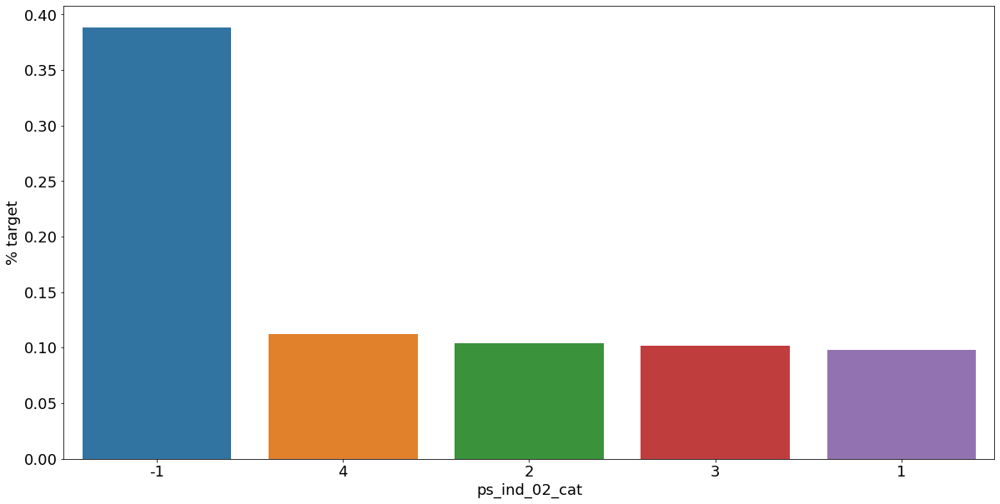

<Figure size 432x288 with 0 Axes>

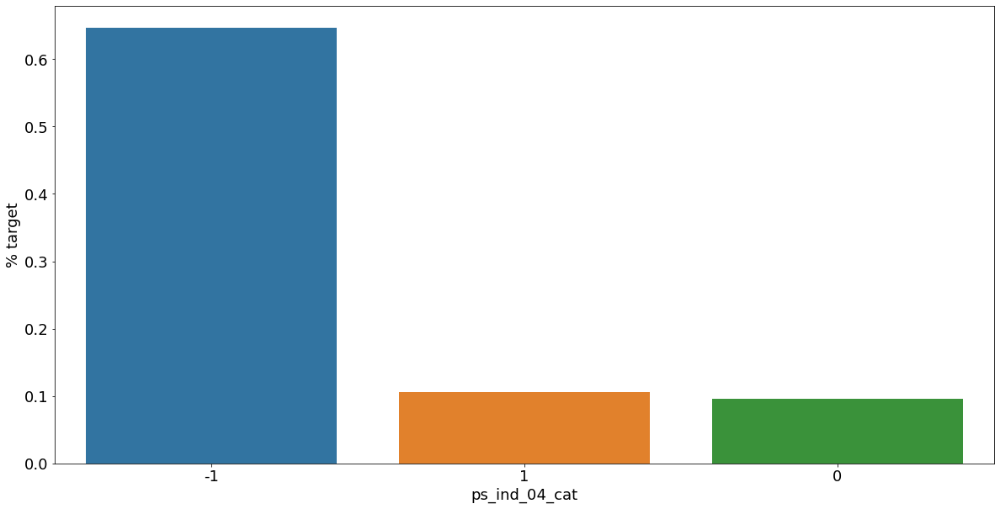

<Figure size 432x288 with 0 Axes>

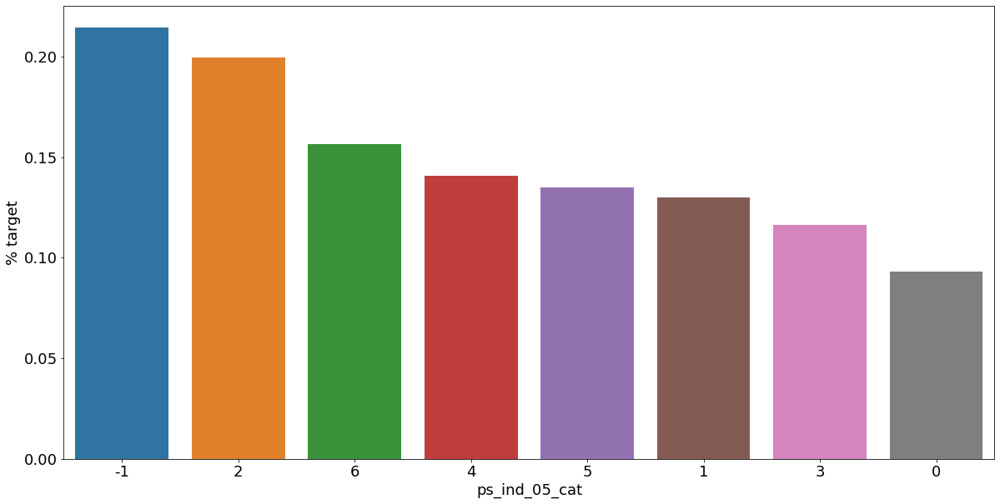

<Figure size 432x288 with 0 Axes>

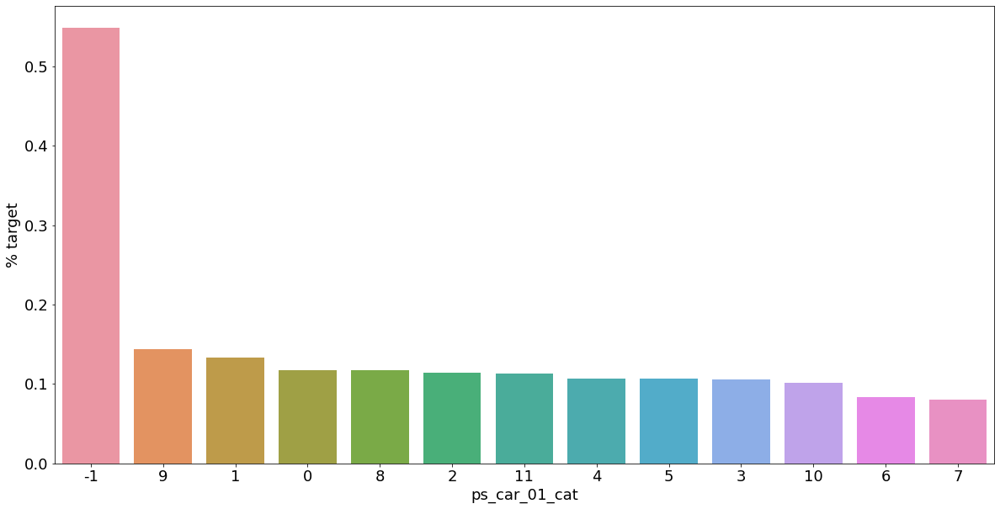

<Figure size 432x288 with 0 Axes>

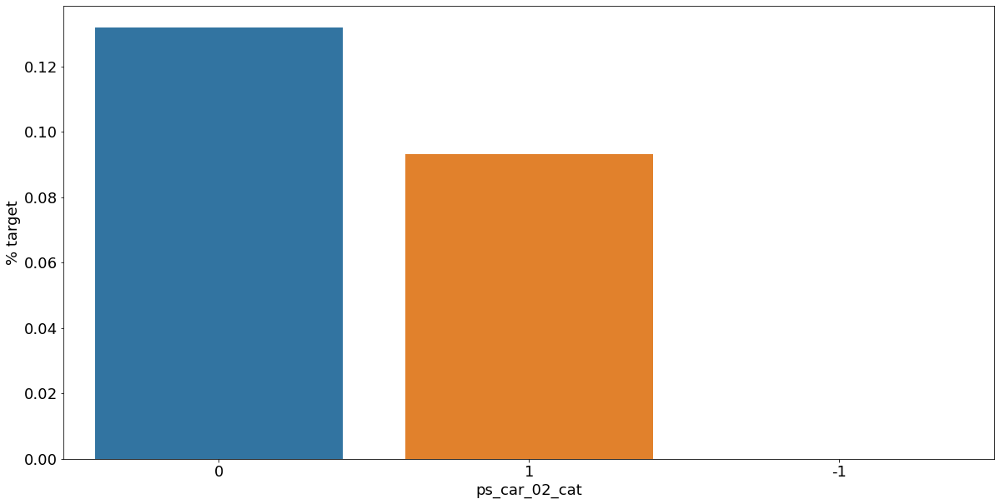

<Figure size 432x288 with 0 Axes>

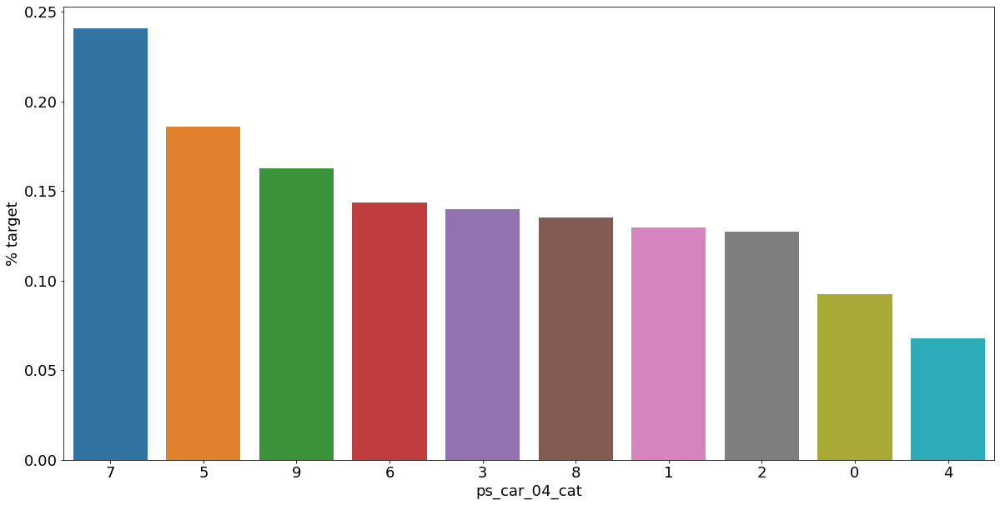

<Figure size 432x288 with 0 Axes>

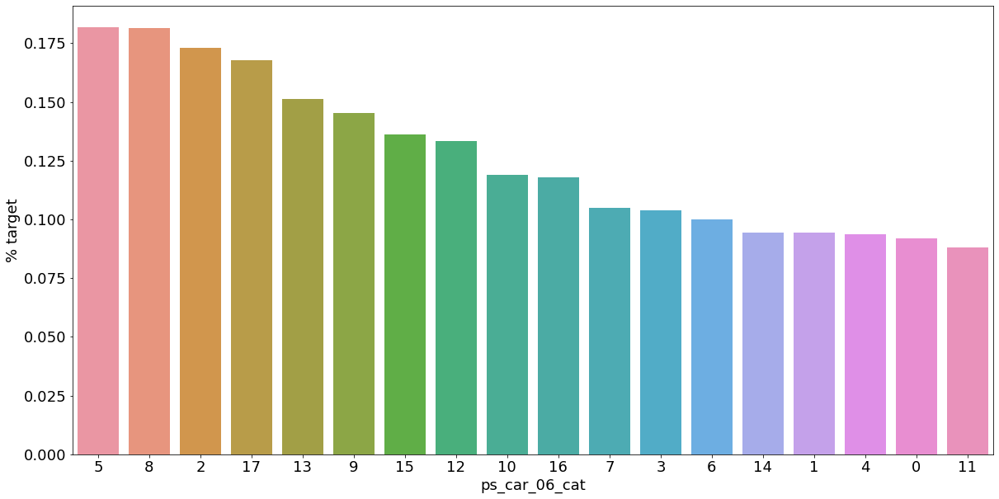

<Figure size 432x288 with 0 Axes>

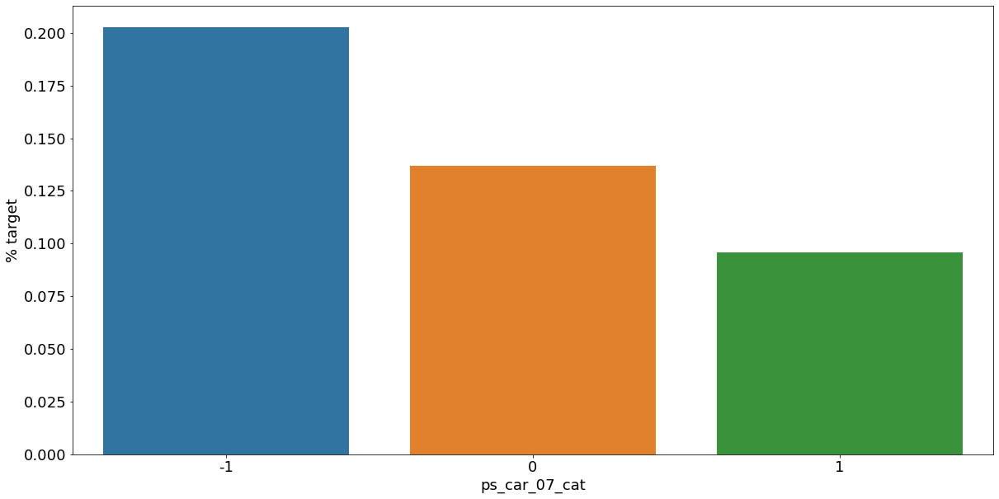

<Figure size 432x288 with 0 Axes>

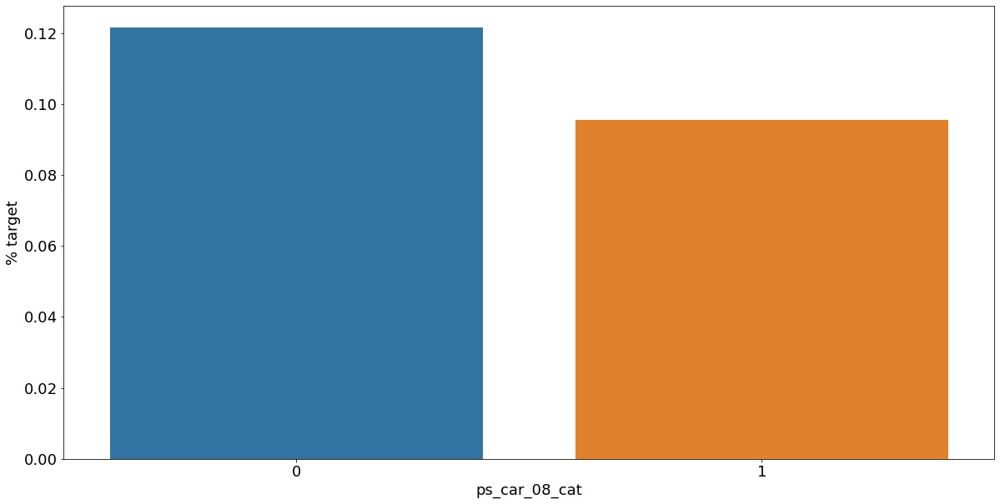

<Figure size 432x288 with 0 Axes>

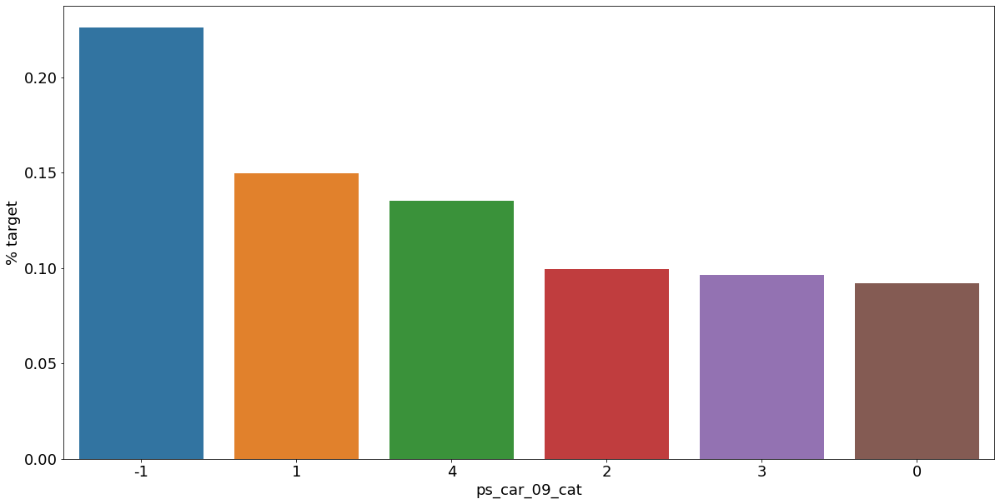

<Figure size 432x288 with 0 Axes>

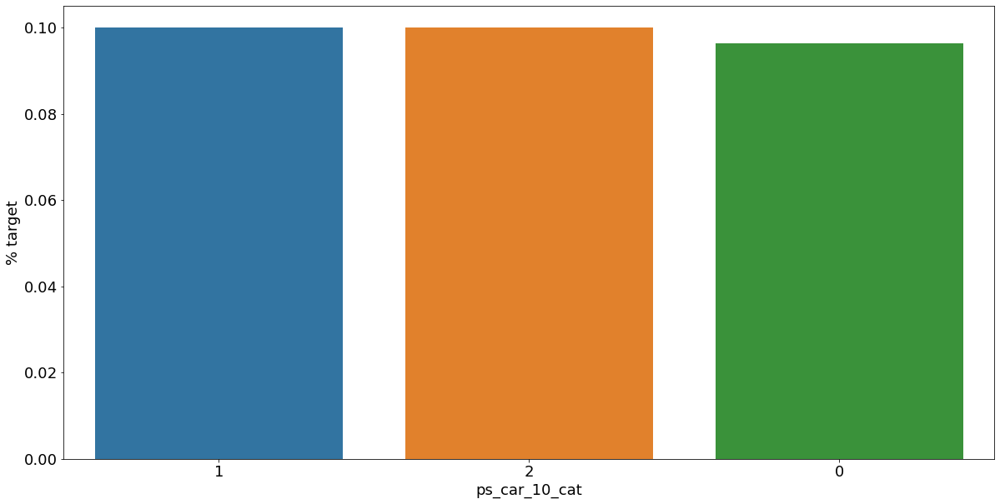

In [34]:
for f in v:
    plt.figure()
    fig, ax = plt.subplots(figsize=(20,10))

    # Calculate the percentage of target=1 per category value
    cat_perc = train[[f, 'target']].groupby([f],as_index = False).mean()
    cat_perc.sort_values(by='target', ascending = False, inplace =True)
    # Bar plot
    # Order the bars descending on target mean
    sns.barplot(ax=ax, x=f, y='target', data=cat_perc, order=cat_perc[f])
    plt.ylabel('% target', fontsize=18)
    plt.xlabel(f, fontsize=18)
    plt.tick_params(axis='both', which='major', labelsize=18)
    plt.show()

- count도 같이 확인하여 잘못된 인사이트를 피해야함. 

- As we can see from the variables __with missing values__, it is a good idea to keep the missing values as a separate category value, instead of replacing them by the mode for instance.
- The customers with a missing value appear to have a much higher (in some cases much lower) probability to ask for an insurance claim.

### Interval variables

- Checking the correlations between interval variables. A heatmap is a good way to visualize the correlation between variables. The code below is based on [an example by Michael Waskom](http://seaborn.pydata.org/examples/many_pairwise_correlations.html "")

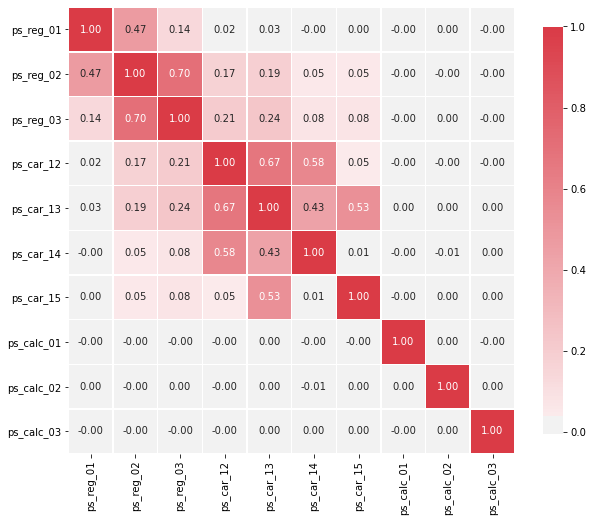

In [35]:
def corr_heatmap(v):
    correlations = train[v].corr()

    # Create color map ranging between two colors
    cmap = sns.diverging_palette(220, 10, as_cmap = True)

    fig, ax = plt.subplots(figsize = (10,10))
    sns.heatmap(correlations, cmap = cmap, vmax = 1.0, center = 0, fmt = '.2f', 
                square = True, linewidths = .5, annot = True, cbar_kws = {"shrink": .75})
    plt.show()

v = meta[(meta.level == 'interval') & (meta.keep)].index
corr_heatmap(v)

- There are a strong correlations between the variables:
    - ps_reg_02 and ps_reg_03 (0.7)
    - ps_car_12 and ps_car13 (0.67)
    - ps_car_12 and ps_car14 (0.58)
    - ps_car_13 and ps_car15 (0.67)

In [36]:
s = train.sample(frac = 0.1)

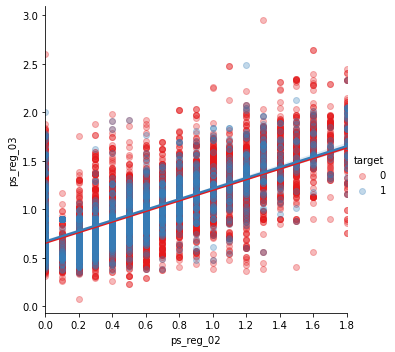

In [37]:
sns.lmplot(x='ps_reg_02', y='ps_reg_03', data=s, hue='target', palette='Set1', scatter_kws={'alpha':0.3}) # alpha는 투명도
plt.show()

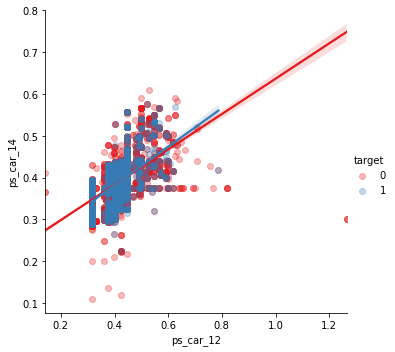

In [38]:
sns.lmplot(x='ps_car_12', y='ps_car_14', data=s, hue='target', palette='Set1', scatter_kws={'alpha':0.3})
plt.show()

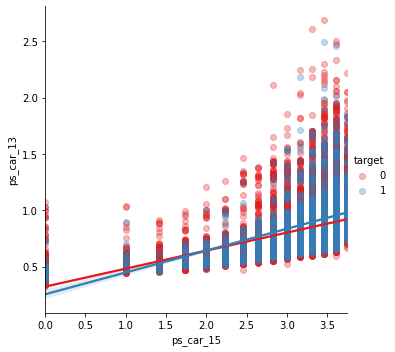

In [39]:
sns.lmplot(x='ps_car_15', y='ps_car_13', data=s, hue='target', palette='Set1', scatter_kws={'alpha':0.3})
plt.show()

- heatmap을 통해 correlation값을 얻었어도, 그래프를 다 그려보면서 왜곡된건 없는지 확인하기

- How can we decide which of the correlated variables to keep?
- We could perform Principal Component Analysis (PCA) on the variables to reduce the dimensions.
- In the AllState Claims Severity Competition I made [this kernel](https://www.kaggle.com/bertcarremans/reducing-number-of-numerical-features-with-pca) to do that.
- But as the number of correlated variables is rather low, we will let the model do the heavy-lifting. (2020.08.25)

### Checking the correlations between ordinal variables

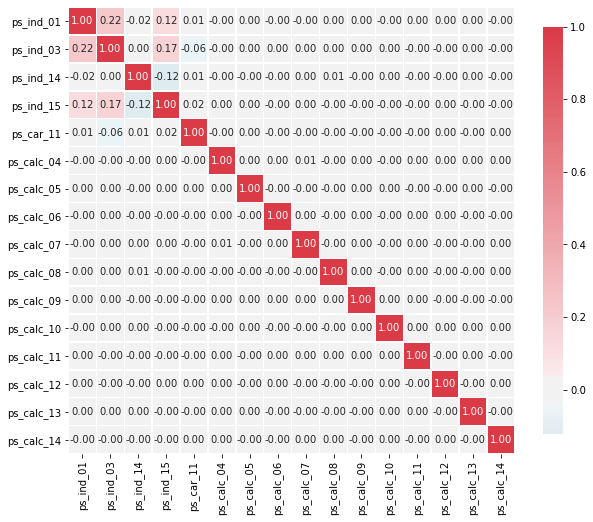

In [40]:
v = meta[(meta.level == 'ordinal') & (meta.keep)].index
corr_heatmap(v)

## Feature engineering

### Creating dummy variables

- The values of the categorical variables do not represent any order or magnitude.
- For example, category 2 is not twice the value of category 1.
- Therefore we can create dummy variables to deal with that.
- We drop the first dummy variable as this information can be derived from the other dummy variables generated for the categories of the original variable.

In [41]:
v = meta[(meta.level == 'nominal') & (meta.keep)].index
print('Before dummification we have {} variables in train'.format(train.shape[1]))
train = pd.get_dummies(train, columns=v, drop_first=True)
print('After dummification we have {} variables in train'.format(train.shape[1]))

Before dummification we have 57 variables in train
After dummification we have 109 variables in train


### Creating interaction variables

In [42]:
v = meta[(meta.level == 'interval') & (meta.keep)].index

In [43]:
poly = PolynomialFeatures(degree = 2, interaction_only = False, include_bias = False)

In [44]:
interactions = pd.DataFrame(data = poly.fit_transform(train[v]), columns = poly.get_feature_names(v))

In [45]:
interactions.drop(v, axis = 1, inplace = True) # Remove the original columns

In [46]:
# Concat the interaction variables to the train data
print('Before creating interactions we have {} variables in train'.format(train.shape[1]))
train = pd.concat([train, interactions], axis=1)
print('After creating interactions we have {} variables in train'.format(train.shape[1]))

Before creating interactions we have 109 variables in train
After creating interactions we have 164 variables in train


## Feature selection

### Removing features with low or zero variance

- Personally, I prefer to let the classifier algorithm choose which features to keep.
- But there is one thing that we can do ourselves.
- That is removing features with no or a very low varinace.
- Sklearn has a handy method to do that: __VarianceThreshold__.

- By default it removes features with zero variance.
- This will not be applicable for this competition as we saw there are no zero-variance variables in the previous step.
- But if we would remove features with less than 1% variance, we would remove 31 variables.

In [47]:
selector = VarianceThreshold(threshold = .01)
selector.fit(train.drop(['id', 'target'], axis = 1)) # Fit to train without id and target varibles

VarianceThreshold(threshold=0.01)

In [48]:
f = np.vectorize(lambda x : not x) # Function to toggle boolean array elements
v = train.drop(['id', 'target'], axis = 1).columns[f(selector.get_support())]
print('{} variables have too low variance.'.format(len(v)))
print('These variables are {}'.format(list(v)))

28 variables have too low variance.
These variables are ['ps_ind_10_bin', 'ps_ind_11_bin', 'ps_ind_12_bin', 'ps_ind_13_bin', 'ps_car_12', 'ps_car_14', 'ps_car_11_cat_te', 'ps_ind_05_cat_2', 'ps_ind_05_cat_5', 'ps_car_01_cat_1', 'ps_car_01_cat_2', 'ps_car_04_cat_3', 'ps_car_04_cat_4', 'ps_car_04_cat_5', 'ps_car_04_cat_6', 'ps_car_04_cat_7', 'ps_car_06_cat_2', 'ps_car_06_cat_5', 'ps_car_06_cat_8', 'ps_car_06_cat_12', 'ps_car_06_cat_16', 'ps_car_06_cat_17', 'ps_car_09_cat_4', 'ps_car_10_cat_1', 'ps_car_10_cat_2', 'ps_car_12^2', 'ps_car_12 ps_car_14', 'ps_car_14^2']


- We would lose rather many variables if we would select based on varinace.
- But because we do not have so many variables, we'll let the classifier choose.
- For data sets with many more variables this could reduce the processing time.
- Sklearn also comes with other feature selction methods. One of these methods is SelectFromModel in which you let another classifier select the best features and continue with these. Below I'll show you how to do that with a Random Forest.

### Selecting features with a Random Forest and SelectFromModel

In [49]:
X_train = train.drop(['id', 'target'], axis = 1)
y_train = train['target']

feat_labels = X_train.columns

rf = RandomForestClassifier(n_estimators = 1000, random_state= 0, n_jobs = -1)

rf.fit(X_train, y_train)
importances = rf.feature_importances_

indices = np.argsort(rf.feature_importances_)[::-1]

for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30,feat_labels[indices[f]], importances[indices[f]]))

1) ps_car_11_cat_te               0.021070
 2) ps_car_13                      0.017398
 3) ps_car_12 ps_car_13            0.017291
 4) ps_car_13^2                    0.017290
 5) ps_car_13 ps_car_14            0.017217
 6) ps_reg_03 ps_car_13            0.017090
 7) ps_reg_01 ps_car_13            0.016839
 8) ps_car_13 ps_car_15            0.016773
 9) ps_reg_03 ps_car_14            0.016259
10) ps_reg_03 ps_car_12            0.015514
11) ps_reg_03 ps_car_15            0.015097
12) ps_car_14 ps_car_15            0.015014
13) ps_car_13 ps_calc_03           0.014682
14) ps_car_13 ps_calc_02           0.014656
15) ps_reg_02 ps_car_13            0.014653
16) ps_reg_01 ps_reg_03            0.014651
17) ps_car_13 ps_calc_01           0.014649
18) ps_reg_01 ps_car_14            0.014357
19) ps_reg_03                      0.014258
20) ps_reg_03^2                    0.014208
21) ps_reg_03 ps_calc_03           0.013831
22) ps_reg_03 ps_calc_02           0.013788
23) ps_reg_03 ps_calc_01         

- With SelectFromModel we can specify which prefit classifier to use and what the threshold is for the feature importances.

In [50]:
sfm = SelectFromModel(rf, threshold='median', prefit=True)
print('Number of features before selection: {}'.format(X_train.shape[1]))
n_features = sfm.transform(X_train).shape[1]
print('Number of features after selection: {}'.format(n_features))
selected_vars = list(feat_labels[sfm.get_support()])

Number of features before selection: 162
Number of features after selection: 81


In [51]:
train = train[selected_vars + ['target']]

## Feature scaling

- As mentioned before, we can apply standard scaling to the training data. Some classifiers perform better when this is done.

In [52]:
scaler = StandardScaler()
scaler.fit_transform(train.drop(['target'], axis=1))

array([[-0.45941104, -1.26665356,  1.05087653, ..., -0.72553616,
        -1.01071913, -1.06173767],
       [ 1.55538958,  0.95034274, -0.63847299, ..., -1.06120876,
        -1.01071913,  0.27907892],
       [ 1.05168943, -0.52765479, -0.92003125, ...,  1.95984463,
        -0.56215309, -1.02449277],
       ...,
       [-0.9631112 ,  0.58084336,  0.48776003, ..., -0.46445747,
         0.18545696,  0.27907892],
       [-0.9631112 , -0.89715418, -1.48314775, ..., -0.91202093,
        -0.41263108,  0.27907892],
       [-0.45941104, -1.26665356,  1.61399304, ...,  0.28148164,
        -0.11358706, -0.72653353]])

- scaling - train 으로 먼저 fitting 시키고, 그 다음에 test tranform
```
df_train = scaler.fit_transform(df_train)
df_test = scaler.transform(df_test) # 주의하기
```

## Conclusion

- Hopefully this notebook helped you with some tips on how to start with this competition. (2020.08.27)